<a href="https://colab.research.google.com/github/Kenz2000/Projet-DATA2/blob/kenza_vf/Partie2_(bbc).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importations

In [ ]:
%%capture
! pip install umap-learn
! gdown 'https://drive.google.com/uc?id=1zTDcgnFtQWUeXgIce4O2Z2OPn0vJH1aD'
! pip install transformers

In [ ]:
from gensim.models import KeyedVectors
import numpy as np
import h5py as h5
import re
import pandas as pd
import pickle
from sklearn.cluster import KMeans
from sklearn.metrics.cluster import normalized_mutual_info_score, adjusted_rand_score
from sklearn.cluster import SpectralClustering
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import warnings
from umap import UMAP
from utils_py import accuracy
from wordcloud import WordCloud, STOPWORDS

/content/utils_py.py:167: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if len(sys.argv) is not 3:


In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


# Utilitaires

## Algorithme de classification

In [ ]:
import os
import math
import numpy as np
import tensorflow.compat.v1 as tf
from sklearn.cluster import KMeans
from tqdm import tqdm

In [ ]:
TF_FLOAT_TYPE = tf.float32

tf.disable_eager_execution()

def fc_layers(input, specs):
    [dimensions, activations, names] = specs
    for dimension, activation, name in zip(dimensions, activations, names):
        input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
    return input

def autoencoder(input, specs):
    [dimensions, activations, names] = specs
    mid_ind = int(len(dimensions)/2)

    # Encoder
    embedding = fc_layers(input, [dimensions[:mid_ind], activations[:mid_ind], names[:mid_ind]])
    # Decoder
    output = fc_layers(embedding, [dimensions[mid_ind:], activations[mid_ind:], names[mid_ind:]])

    return embedding, output

def f_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def g_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def next_batch(num, data):
    """
    Return a total of `num` random samples.
    """
    indices = np.arange(0, data.shape[0])
    np.random.shuffle(indices)
    indices = indices[:num]
    batch_data = np.asarray([data[i, :] for i in indices])

    return indices, batch_data

## Deep Clustering Network

In [ ]:
class DcnCompGraph(object):
    """Computation graph for the Deep Clustering Network model proposed in:
        Yang, B., Fu, X., Sidiropoulos, N. D., & Hong, M. (2017). Towards K-means-friendly Spaces: Simultaneous Deep
        Learning and Clustering. In ICML '17 (pp. 3861–3870).
    This implementation is inspired by https://github.com/boyangumn/DCN
    """

    def __init__(self, ae_specs, n_clusters, batch_size, n_samples, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0]) - 1) / 2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(batch_size, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g
        self.ae_loss = tf.reduce_mean(rec_error)

        # Clustering loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## Clustering assignments for all samples in the dataset
        initial_clustering_assign = tf.random_uniform(minval=0, maxval=n_clusters, dtype=tf.int32, shape=[n_samples])
        self.cluster_assign = tf.Variable(initial_clustering_assign, name='cluster_assign', dtype=tf.int32, trainable=False)

        ## Get the cluster representative corresponding to the cluster of each batch sample
        self.indices = tf.placeholder(dtype=tf.int32, shape=batch_size)  # Placeholder for sample indices in current batch
        batch_clust_rep = []
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            batch_clust_rep.append(self.cluster_rep[k, :])
        stack_batch_clust_rep = tf.stack(batch_clust_rep)

        ## Compute the k-means term
        clustering_error = f_func(self.embedding, stack_batch_clust_rep)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(clustering_error)
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DCN
        self.train_op = optimizer.minimize(self.loss)

        # As it has been pointed out in the DCN paper, first the weights of the autoencoder shall be trained then the
        # assignments and cluster representatives. So far in the computation graph we have optimized the weights of the
        # autoencoder, now it's the time for the assignments and representatives.

        # Update the clustering assignments
        for j in range(batch_size):
            # Find which cluster representative is the closest to the current batch sample
            new_assign = tf.argmin(f_func(tf.reshape(self.embedding[j, :], (1, embedding_size)), self.cluster_rep),
                                   output_type=tf.int32)
            # Update the clustering assignment
            self.cluster_assign_update = tf.assign(self.cluster_assign[self.indices[j]], new_assign)

        # Update the cluster representatives
        ## Initialize the value of count
        initial_count = tf.constant(100.0, shape=[n_clusters])
        count = tf.Variable(initial_count, name='count', dtype=TF_FLOAT_TYPE, trainable=False)
        ## Update the cluster representatives according to Equation (8) in the DCN paper
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            self.count_update = tf.assign(count[k], count[k] + 1)  # Updated count for cluster assignments
            new_rep = self.cluster_rep[k] - (1 / count[k]) * (self.cluster_rep[k] - self.embedding[j])
            self.cluster_rep_update = tf.assign(self.cluster_rep[k], new_rep)

In [ ]:
def DCN(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small
    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    cg = DcnCompGraph([dimensions, activations, names], n_clusters, batch_size, n_samples,
                      lambda_)

    # Run the computation graph
    with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):

                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices_, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                       feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices_)):
                        embeddings[indices_[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DCN
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

            # The clustering assignments are used to initialize the clustering assignments in DCN
            sess.run(tf.assign(cg.cluster_assign, kmeans_model.labels_))

        # Train the full DCN model
        print("Starting DCN training...")
        ## Loop over epochs
        for epoch in tqdm(range(n_finetuning_epochs)):
            # print("Training step: epoch {}".format(epoch))

            # Loop over the samples
            for _ in range(n_batches):
                # Fetch a random data batch of the specified size
                indices_, data_batch = next_batch(batch_size, data)

                # Run the computation graph on the data batch
                _, _, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                    sess.run((cg.train_op, cg.cluster_assign_update, cg.count_update, cg.cluster_rep_update, cg.loss,
                              cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                             feed_dict={cg.input: data_batch, cg.indices: indices_})
        
        embeddings = np.zeros((n_samples, embedding_size), dtype=float)
        for _ in range(n_batches):
            # Fetch a random data batch of the specified size
            indices_, data_batch = next_batch(batch_size, data)

            # Run the computation graph on the data batch
            _, _, embeddings_, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                sess.run((cg.train_op, cg.cluster_assign_update, cg.embedding, cg.count_update, cg.cluster_rep_update, cg.loss,
                          cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                          feed_dict={cg.input: data_batch, cg.indices: indices_})

            for j in range(len(indices_)):
                embeddings[indices_[j], :] = embeddings_[j, :]
                
    return embeddings, cluster_assign_


## Deep K-means

In [ ]:
class DkmCompGraph(object):
    """Computation graph for Deep K-Means
    """

    def __init__(self, ae_specs, n_clusters, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0])-1)/2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(None, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g

        # k-Means loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## First, compute the distance f between the embedding and each cluster representative
        list_dist = []
        for i in range(0, n_clusters):
            dist = f_func(self.embedding, tf.reshape(self.cluster_rep[i, :], (1, embedding_size)))
            list_dist.append(dist)
        self.stack_dist = tf.stack(list_dist)

        ## Second, find the minimum squared distance for softmax normalization
        min_dist = tf.reduce_min(list_dist, axis=0)

        ## Third, compute exponentials shifted with min_dist to avoid underflow (0/0) issues in softmaxes
        self.alpha = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=())  # Placeholder tensor for alpha
        list_exp = []
        for i in range(n_clusters):
            exp = tf.exp(-self.alpha * (self.stack_dist[i] - min_dist))
            list_exp.append(exp)
        stack_exp = tf.stack(list_exp)
        sum_exponentials = tf.reduce_sum(stack_exp, axis=0)

        ## Fourth, compute softmaxes and the embedding/representative distances weighted by softmax
        list_softmax = []
        list_weighted_dist = []
        for j in range(n_clusters):
            softmax = stack_exp[j] / sum_exponentials
            weighted_dist = self.stack_dist[j] * softmax
            list_softmax.append(softmax)
            list_weighted_dist.append(weighted_dist)
        stack_weighted_dist = tf.stack(list_weighted_dist)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(tf.reduce_sum(stack_weighted_dist, axis=0))
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DKM
        self.train_op = optimizer.minimize(self.loss) # Train the whole DKM model

In [ ]:
def DKM(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    """
        The final number of finetuning epochs is n_finetuning_epochs * 20 if pretrain and n_finetuning_epochs * 40 if annealing
    """
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained
    annealing = False # Specify if annealing should be used

    # Define the alpha scheme depending on if the approach includes annealing/pretraining
    if annealing and not pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 40  # Number of alpha values to consider
        alphas = np.zeros(max_n, dtype=float)
        alphas[0] = 0.1
        for i in range(1, max_n):
            alphas[i] = (2 ** (1 / (np.log(i + 1)) ** 2)) * alphas[i - 1]
        alphas = alphas / constant_value
    elif not annealing and pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 20  # Number of alpha values to consider (constant values are used here)
        alphas = 1000*np.ones(max_n, dtype=float) # alpha is constant
        alphas = alphas / constant_value
    else:
        raise Exception("Run with either annealing (-a) or pretraining (-p), but not both.")

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small

    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)
    config = tf.ConfigProto(gpu_options=gpu_options)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)
      
    # Define the computation graph for DKM
    cg = DkmCompGraph([dimensions, activations, names], n_clusters, lambda_)

    # Run the computation graph
    with tf.Session(config=config) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Variables to save tensor content
        distances = np.zeros((n_clusters, n_samples))

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                        feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices)):
                        embeddings[indices[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DKM
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

        # Train the full DKM model
        if (len(alphas) > 0):
            print("Starting DKM training...")
        ## Loop over alpha (inverse temperature), from small to large values
        for k in tqdm(range(len(alphas))):
            # Loop over epochs per alpha
            for _ in range(n_finetuning_epochs):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph on the data batch
                    _, loss_, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
                        sess.run((cg.train_op, cg.loss, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                                  feed_dict={cg.input: data_batch, cg.alpha: alphas[k]})

                    # Save the distances for batch samples
                    for j in range(len(indices)):
                        distances[:, indices[j]] = stack_dist_[:, j]

        _, loss_, X_reduced, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
        sess.run((cg.train_op, cg.loss, cg.embedding, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                  feed_dict={cg.input: data, cg.alpha: alphas[k]})

        distances = stack_dist_

        # Infer cluster assignments for all samples
        cluster_assign = np.zeros((n_samples), dtype=float)
        for i in range(n_samples):
            index_closest_cluster = np.argmin(distances[:, i])
            cluster_assign[i] = index_closest_cluster
        cluster_assign = cluster_assign.astype(np.int64)

    return X_reduced, cluster_assign

# Chargement de données

In [ ]:

## bbc
! gdown "https://drive.google.com/uc?id=1--FNn99G1Uut0R1v6mFqiuBi_pG-jC6o"
! gdown "https://drive.google.com/uc?id=1-04KQb6ykGW20yXI8dSZk5YJQKT2CRGh"
! gdown "https://drive.google.com/uc?id=1-Msc4M3lNz-O0sy13iPhtQIYxw9GG3tJ"
! gdown "https://drive.google.com/uc?id=1-jbNYCPMYeOvHMlewE8KYxob8dByECye"
! gdown "https://drive.google.com/uc?id=1PSjnBVZM_hmM0jtQrZ7QNuzTeWDTPuHM"

Downloading...
From: https://drive.google.com/uc?id=1270jrqfjC_j9jbujB8n6bTovnqCBG1Xp
To: /content/classic4_word2vec.h5
100% 17.1M/17.1M [00:00<00:00, 73.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-0eXYefFHTliAuFfrRX8g2gnkYlF3Z5H
To: /content/classic4_glove.h5
100% 17.1M/17.1M [00:00<00:00, 82.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-DAowc4ysRC9wDy60lzs8I6FIhLE4BEb
To: /content/classic4_bert.h5
100% 262M/262M [00:01<00:00, 183MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-ckFmuejFrNGx0mbhqwNIhewCeuOfGxs
To: /content/classic4_roberta.h5
100% 262M/262M [00:01<00:00, 168MB/s]
Downloading...
From: https://drive.google.com/uc?id=1vKduM6oCoGWWiXZrn1P33rnu74YbJJ2T
To: /content/classic4.csv
100% 5.02M/5.02M [00:00<00:00, 139MB/s]
Downloading...
From: https://drive.google.com/uc?id=1--FNn99G1Uut0R1v6mFqiuBi_pG-jC6o
To: /content/bbc_word2vec.h5
100% 2.70M/2.70M [00:00<00:00, 214MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-04KQb6ykG

In [ ]:

bbc_word2vec = pd.read_hdf("bbc_word2vec.h5").to_numpy()
bbc_glove = pd.read_hdf("bbc_glove.h5").to_numpy()
bbc_bert = pd.read_hdf("bbc_bert.h5").to_numpy()
bbc_roberta = pd.read_hdf("bbc_roberta.h5").to_numpy()

In [ ]:
bbc_texts = pd.read_csv("bbc.csv")["text"].values
bbc_labels = pd.read_csv("bbc.csv")["label"].values
k_bbc = len(set(bbc_labels))

# Fonctions utilitaires

In [ ]:
def map_labels(labels):
    mapping = {}
    for (i,name) in enumerate(set(labels)):
        mapping[name] = i
    return [mapping[letter] for letter in labels]

In [ ]:
def eval_clustering_2D(x, labels, pred_labels, methods):
    fig, axes = plt.subplots(1, len(pred_labels)+1, figsize=(20,10))
    axes[0].scatter(x[:,0], x[:,1],
                    c=labels, edgecolor='none', alpha=1,)
    axes[0].title.set_text('Real Labels')
    nmis, aris, accs = {}, {}, {}
    for i in range(len(pred_labels)):
        nmi = normalized_mutual_info_score(labels, pred_labels[i])
        ari = adjusted_rand_score(labels, pred_labels[i])
        acc = accuracy(labels, pred_labels[i])
        nmis[methods[i]] = nmi
        aris[methods[i]] = ari
        accs[methods[i]] = acc
        axes[i+1].scatter(x[:,0], x[:,1],
                    c=pred_labels[i], edgecolor='none', alpha=1,)
        axes[i+1].title.set_text('{}\nNMI = {:.6f}\nARI={:.6f}\nACC={:.6f}'.format(methods[i], nmi, ari, acc))
    
    return nmis, aris, accs

In [ ]:
def run_methods(func, X, k, method_name, file_name, dataset, rep, ns = [2, 3, 5, 10, 20]):
  print(f'Executing of {method_name} method on the dataset: "{dataset}" with {rep} representation.')
  ALG_labels, ALG_methods = [], []
  for n_components in ns:
    print('Number of components:', n_components)
    alg_embeddings, alg_labels = func(X, k, n_components, seed=n_components)
    ALG_labels.append(alg_labels), ALG_methods.append(f'{method_name} - n_components = {n_components}')
    with h5.File(file_name, 'a') as alg_file:
      alg_file.create_dataset(f'{dataset}_default{n_components}components_embed_{rep}', data=alg_embeddings)
      alg_file.create_dataset(f'{dataset}_default{n_components}components_labels_{rep}', data=alg_labels)
  return ALG_labels, ALG_methods

In [ ]:
def print_wordcloud(X, labels):
    temp_df = pd.DataFrame({
        "text": X,
        "labels": labels
    })
    for label in temp_df['labels'].unique():
        alltext = ' '.join(temp_df[temp_df['labels']== label]['text'])
        wordcloud = WordCloud().generate(alltext)
        # Display the generated image:
        print(f'Class: {label}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        print(f'\n')

#BBC (approche jointe ,simultanée)

In [ ]:
dataset = 'bbc'
k = k_bbc
labels = bbc_labels
bbc_resluts = {}

## La représentation Word2Vec

In [ ]:
X = bbc_word2vec
rep = 'word2vec'

### DCN

In [ ]:
file_name = './dcn_file.h5'
DCN_labels, DCN_methods = run_methods(DCN, X, k, 'DCN', file_name, dataset, rep)

Executing of DCN method on the dataset: "bbc" with word2vec representation.
Number of components: 2


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 27.42it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:14<00:00,  3.52it/s]


Number of components: 3


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 25.36it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:11<00:00,  4.18it/s]


Number of components: 5


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:02<00:00, 22.24it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:12<00:00,  4.10it/s]


Number of components: 10


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 27.54it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:11<00:00,  4.29it/s]


Number of components: 20


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:02<00:00, 20.68it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:10<00:00,  4.56it/s]


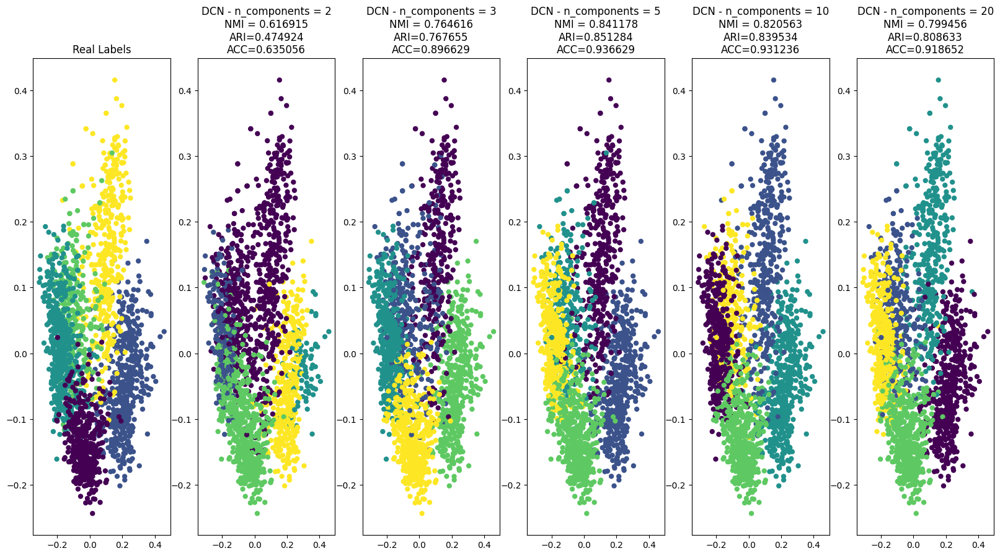

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(X)
nmis, aris, accs = eval_clustering_2D(X_reduced, map_labels(labels), DCN_labels, DCN_methods)

En utilisant la dataset 'bbc' avec la représentation 'word2vec' et en visualisant l'espace avec l'ACP à 2 dimensions, il est constaté que les classes sont difficilement séparables.

Les résultats obtenus démontrent que la méthode DCN a donné de bons résultats de classification dès la première exécution, avec un nombre de composantes de 2 atteignat 93% d'accuracy ,84% de nmi et 85% d'ari pour un nombre de composantes égale 5 . De plus, en augmentant le nombre de composantes, on observe une amélioration continue des résultats, comme en témoignent les trois métriques qui augmentent à chaque augmentation du nombre de composantes.

In [ ]:
key = '{}_{}_dcn'.format(dataset, rep)
bbc_resluts[key] = (nmis, aris, accs)

### DKM

In [ ]:
file_name = './dkm_file.h5'
DKM_labels, DKM_methods = run_methods(DKM, X, k, 'DKM', file_name, dataset, rep)

Executing of DKM method on the dataset: "bbc" with word2vec representation.
Number of components: 2


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 26.51it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:06<00:00,  3.02it/s]


Number of components: 3


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:02<00:00, 24.73it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:06<00:00,  3.18it/s]


Number of components: 5


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:02<00:00, 21.93it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:06<00:00,  3.21it/s]


Number of components: 10


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 26.62it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:07<00:00,  2.63it/s]


Number of components: 20


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 27.67it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:06<00:00,  2.89it/s]


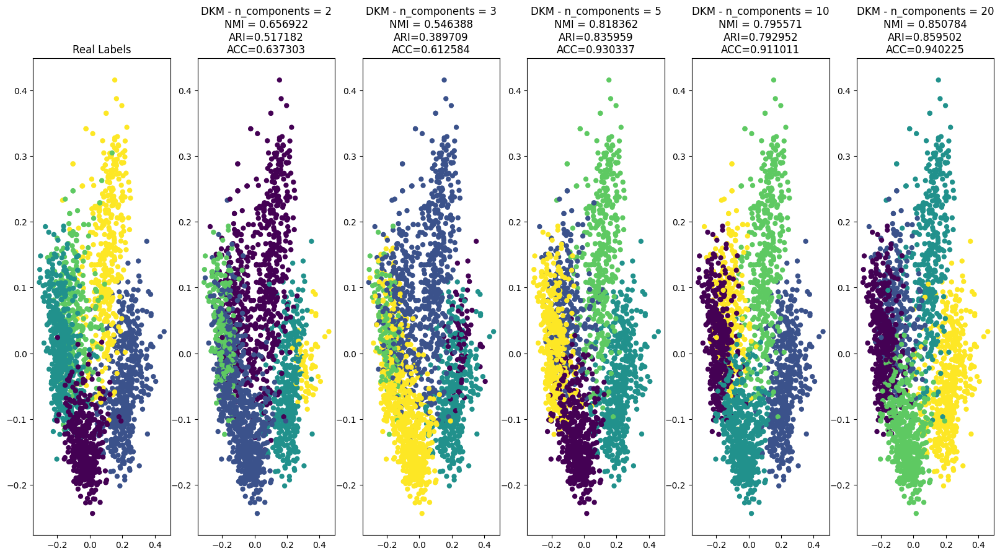

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(X)
nmis, aris, accs = eval_clustering_2D(X_reduced, map_labels(labels), DKM_labels, DKM_methods)

En utilisant la même représentation word2vec et en appliquant la méthode DKM avec différents nombres de composantes, on remarque que le clustering proposé est systématiquement meilleure que celle obtenue par DCN avec le même nombre de composantes. Cette amélioration est perceptible à travers les graphiques de visualisation ainsi qu'au niveau des trois métriques évaluées (NMI, ARI et Accuracy).Avec un nombre de composantes  égal à 20 ,l'accuracy atteint 94% ,85% de nmi  et 85% d'ari.

In [ ]:
key = '{}_{}_dkm'.format(dataset, rep)
bbc_resluts[key] = (nmis, aris, accs)

## La représentation GloVe

In [ ]:
X = bbc_glove
rep = 'GloVe'

### DCN

In [ ]:
file_name = './dcn_file.h5'
DCN_labels, DCN_methods = run_methods(DCN, X, k, 'DCN', file_name, dataset, rep)

Executing of DCN method on the dataset: "bbc" with GloVe representation.
Number of components: 2


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 27.71it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:11<00:00,  4.39it/s]


Number of components: 3


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:02<00:00, 21.48it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:11<00:00,  4.30it/s]


Number of components: 5


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 27.94it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:11<00:00,  4.23it/s]


Number of components: 10


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:02<00:00, 20.87it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:09<00:00,  5.34it/s]


Number of components: 20


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 28.07it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:10<00:00,  4.70it/s]


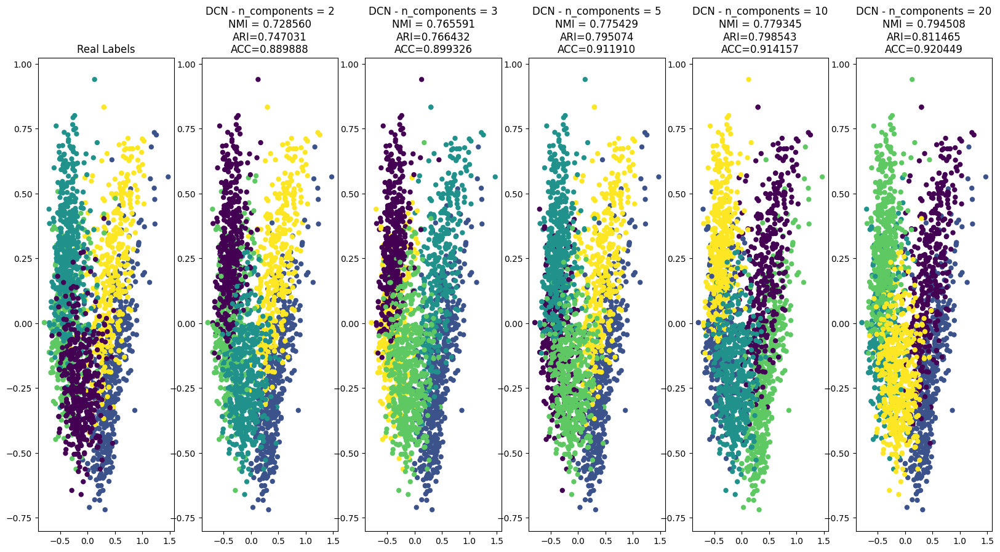

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(X)
nmis, aris, accs = eval_clustering_2D(X_reduced, map_labels(labels), DCN_labels, DCN_methods)

Lors de l'exploitation de la même dataset 'bbc' avec la représentation 'GloVe' et en effectuant une visualisation de l'espace en utilisant l'ACP en deux dimensions, il devient évident que les classes sont difficilement séparables.
Les résultats obtenus démontrent que la méthode DCN a produit de bons résultats de classification dès sa première exécution, même avec seulement deux composantes. De plus, une augmentation du nombre de composantes entraîne systématiquement une amélioration des résultats, comme en témoigne la progression des trois métriques évaluées. Les résultats obtenus sont pratiquement similaires à ceux obtenus avec la représentation word2vec.

In [ ]:
key = '{}_{}_dcn'.format(dataset, rep)
bbc_resluts[key] = (nmis, aris, accs)

### DKM

In [ ]:
file_name = './dkm_file.h5'
DKM_labels, DKM_methods = run_methods(DKM, X, k, 'DKM', file_name, dataset, rep)

Executing of DKM method on the dataset: "bbc" with GloVe representation.
Number of components: 2


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 27.94it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:07<00:00,  2.63it/s]


Number of components: 3


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 29.50it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:05<00:00,  3.36it/s]


Number of components: 5


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:02<00:00, 20.46it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:06<00:00,  3.32it/s]


Number of components: 10


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 27.42it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:07<00:00,  2.62it/s]


Number of components: 20


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 29.60it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:05<00:00,  3.36it/s]


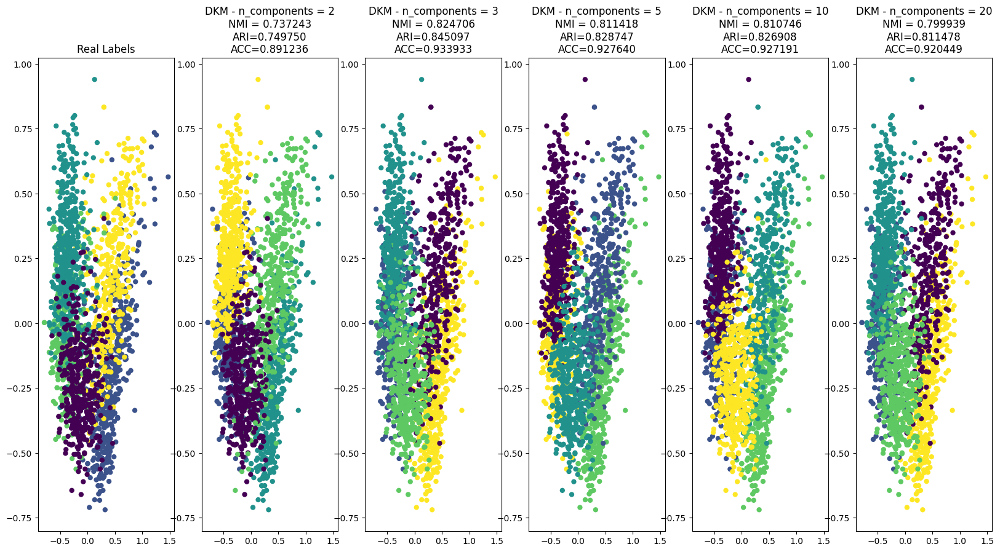

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(X)
nmis, aris, accs = eval_clustering_2D(X_reduced, map_labels(labels), DKM_labels, DKM_methods)

Comme précédemment, on peut constater que la méthode DKM offre de meilleurs résultats par rapport à DCN avec la même dataset. De plus, les résultats sont presque similaires quel que soit le choix de la représentation des mots, que ce soit word2vec ou GloVe.

In [ ]:
key = '{}_{}_dkm'.format(dataset, rep)
bbc_resluts[key] = (nmis, aris, accs)

## La représentation  bert

In [ ]:
X = bbc_bert
rep = 'bert'

### DCN

In [ ]:
file_name = './dcn_file.h5'
DCN_labels, DCN_methods = run_methods(DCN, X, k, 'DCN', file_name, dataset, rep)

Executing of DCN method on the dataset: "bbc" with bert representation.
Number of components: 2


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:15<00:00,  3.25it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:23<00:00,  2.10it/s]


Number of components: 3


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:17<00:00,  2.90it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:24<00:00,  2.06it/s]


Number of components: 5


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:15<00:00,  3.18it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:24<00:00,  2.06it/s]


Number of components: 10


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:16<00:00,  3.01it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:23<00:00,  2.13it/s]


Number of components: 20


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:15<00:00,  3.21it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:24<00:00,  2.03it/s]


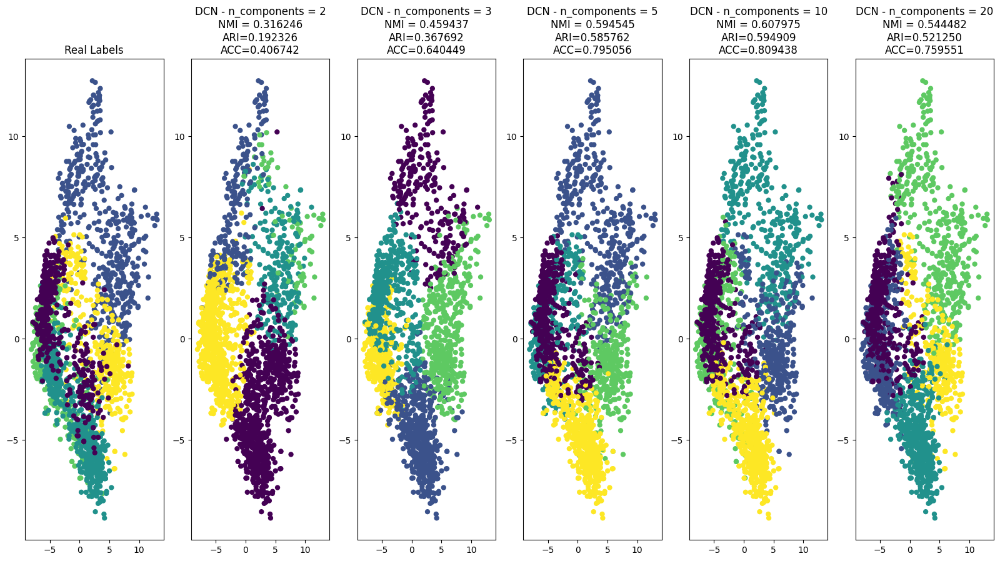

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(X)
nmis, aris, accs = eval_clustering_2D(X_reduced, map_labels(labels), DCN_labels, DCN_methods)

La visualisation de l'espace de la représentation Bert pour la dataset 'bbc' révèle que les clusters ne sont pas facilement séparables, et qu'une augmentation du nombre de composantes améliore significativement la qualité du clustering.


In [ ]:
key = '{}_{}_dcn'.format(dataset, rep)
bbc_resluts[key] = (nmis, aris, accs)

### DKM

In [ ]:
file_name = './dkm_file.h5'
DKM_labels, DKM_methods = run_methods(DKM, X, k, 'DKM', file_name, dataset, rep)

Executing of DKM method on the dataset: "bbc" with bert representation.
Number of components: 2


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:16<00:00,  3.08it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:35<00:00,  1.79s/it]


Number of components: 3


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:16<00:00,  3.04it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:32<00:00,  1.60s/it]


Number of components: 5


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:15<00:00,  3.21it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:33<00:00,  1.65s/it]


Number of components: 10


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:15<00:00,  3.20it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:32<00:00,  1.63s/it]


Number of components: 20


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:15<00:00,  3.20it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:33<00:00,  1.65s/it]


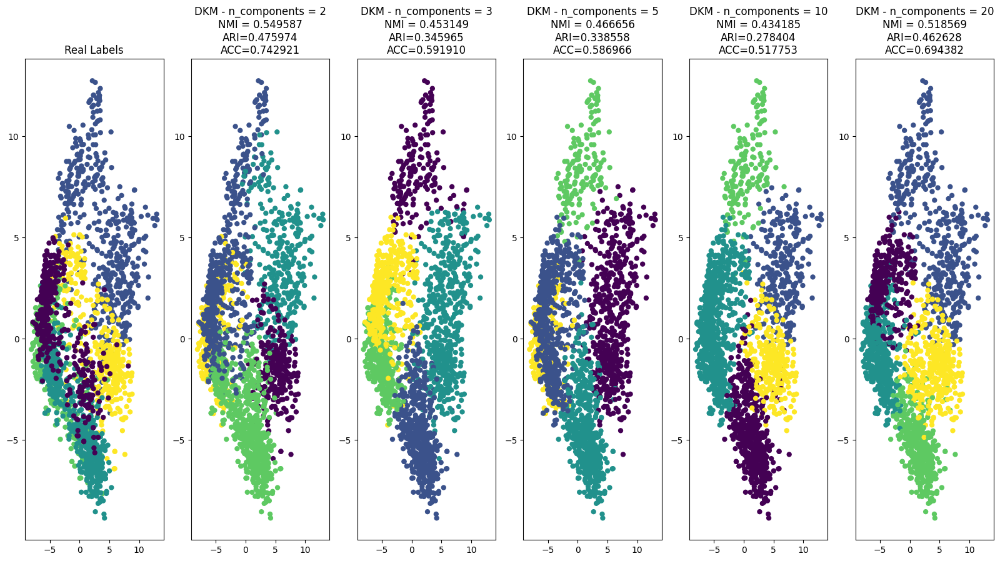

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(X)
nmis, aris, accs = eval_clustering_2D(X_reduced, map_labels(labels), DKM_labels, DKM_methods)

Lors de l'observation du dataset 'bbc' et en utilisant la représentation Bert, nous constatons que les clusters ne sont pas facilement distinguables dans l'espace réduit. Cependant, en augmentant le nombre de composantes, nous observons une amélioration notable et significative de la qualité de notre classification. Malgré cela, les différentes combinaisons de la méthode DCN avec différentes nombre de composantes ne parviennent pas à séparer efficacement les classes dans leur espace d'origine. Néanmoins, la plupart des résultats obtenus présentent une performance significative, avec une NMI de 54%, un ARI de 47% et une accuracy de 74% et cela pour un nombre de composante égal a 2. Ces résultats sont considérés comme très bons par rapport aux représentations Glove et Word2Vec, pour lesquelles les performances étaient faibles , sans amélioration significative en variant le nombre de composantes.

In [ ]:
key = '{}_{}_dkm'.format(dataset, rep)
bbc_resluts[key] = (nmis, aris, accs)

## La représentation roberta

In [ ]:
X = bbc_roberta
rep = 'roberta'

### DCN

In [ ]:
file_name = './dcn_file.h5'
DCN_labels, DCN_methods = run_methods(DCN, X, k, 'DCN', file_name, dataset, rep)

Executing of DCN method on the dataset: "bbc" with roberta representation.
Number of components: 2


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:16<00:00,  3.03it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:26<00:00,  1.92it/s]


Number of components: 3


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:16<00:00,  3.01it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:24<00:00,  2.07it/s]


Number of components: 5


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:16<00:00,  2.96it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:25<00:00,  2.00it/s]


Number of components: 10


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:16<00:00,  3.07it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:24<00:00,  2.04it/s]


Number of components: 20


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:16<00:00,  3.06it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:26<00:00,  1.89it/s]


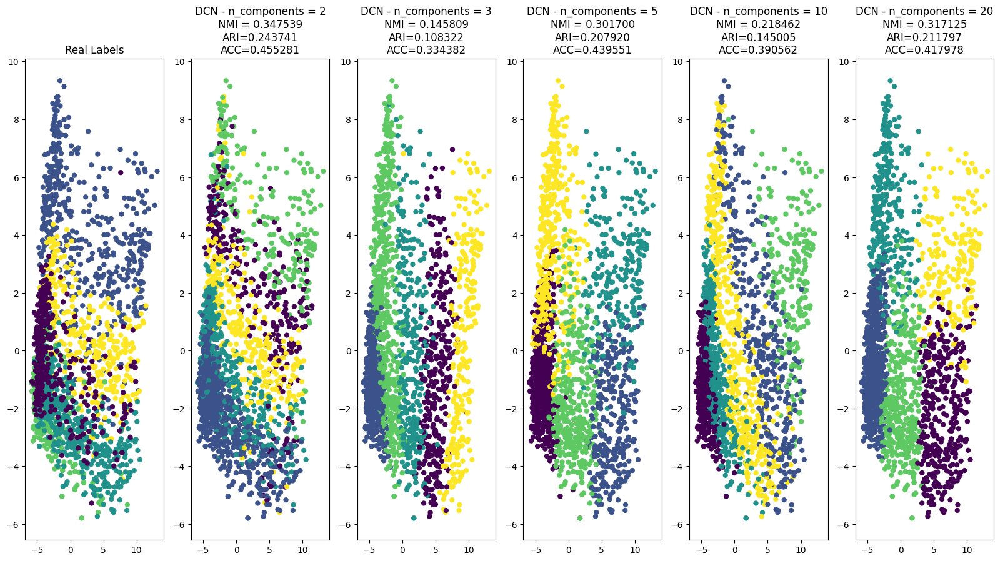

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(X)
nmis, aris, accs = eval_clustering_2D(X_reduced, map_labels(labels), DCN_labels, DCN_methods)

En observant la visualisation de l'espace de la représentation Roberta du dataset 'bbc' , nous constatons que les clusters ne sont pas facilement séparables. Malgré l'augmentation du nombre de composantes à chaque fois, cela ne semble pas améliorer significativement la qualité de notre clustering. Les différentes combinaisons de la méthode DCN avec des nombres de composantes différents ne parviennent pas à séparer efficacement les classes dans leur espace d'origine, ce qui se reflète par des valeurs d'ARI faible ou, indiquant une similarité avec une estimation aléatoire des étiquettes.


In [ ]:
key = '{}_{}_dcn'.format(dataset, rep)
bbc_resluts[key] = (nmis, aris, accs)

### DKM

In [ ]:
file_name = './dkm_file.h5'
DKM_labels, DKM_methods = run_methods(DKM, X, k, 'DKM', file_name, dataset, rep)

Executing of DKM method on the dataset: "bbc" with roberta representation.
Number of components: 2


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:16<00:00,  3.05it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:34<00:00,  1.71s/it]


Number of components: 3


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:16<00:00,  3.09it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:33<00:00,  1.68s/it]


Number of components: 5


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:16<00:00,  3.08it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:33<00:00,  1.69s/it]


Number of components: 10


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:16<00:00,  2.96it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:35<00:00,  1.77s/it]


Number of components: 20


<ipython-input-5-d8c36472c57e>:8: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:16<00:00,  3.08it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:35<00:00,  1.77s/it]


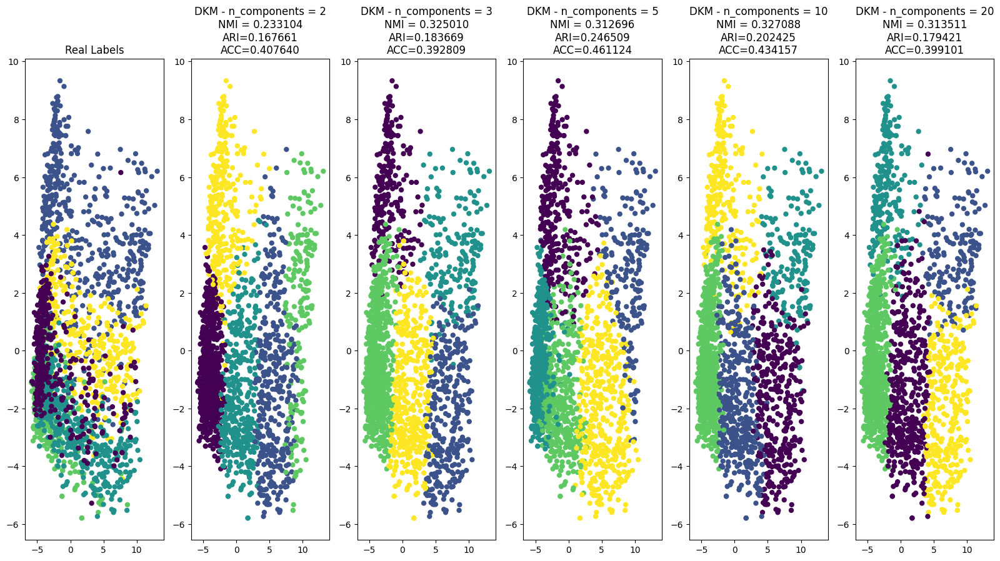

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(X)
nmis, aris, accs = eval_clustering_2D(X_reduced, map_labels(labels), DKM_labels, DKM_methods)

En utilisant la représentation Roberta et en appliquant la méthode DKM avec différentes dimensions, nous constatons que le clustering obtenue  présente des performances similaires à celles obtenues avec DCN. Cependant, nous remarquons que l'augmentation du nombre de composantes entraîne une dégradation des performances de clustering selon toutes les mesures évaluées.Dans l'ensemble , la représentation Roberta offre des résultats (accuracy 40%, nmi 25% et ari 32%)moins bon que celle de Bert (accuracy 94% , nmi 85% et ari 85%)

In [ ]:
key = '{}_{}_dkm'.format(dataset, rep)
bbc_resluts[key] = (nmis, aris, accs)

## Tableau des résultats

In [ ]:
with open("./bbcpart2results.pkl", "wb") as results_file:
  pickle.dump(bbc_resluts, results_file)

In [ ]:
BBC_results = {key: {inkey: {'nmi': nmi[inkey],'ari': ari[inkey],'acc': acc[inkey]} for inkey in nmi.keys()}  for key, (nmi, ari, acc) in bbc_resluts.items()}
bbc_results_dataframe = pd.DataFrame.from_dict({(i,j): BBC_results[i][j] 
                           for i in BBC_results.keys() 
                           for j in BBC_results[i].keys()},
                       orient='index')
bbc_results_dataframe

nmi       ari       acc
bbc_word2vec_dcn DCN - n_components = 2   0.616915  0.474924  0.635056
                 DCN - n_components = 3   0.764616  0.767655  0.896629
                 DCN - n_components = 5   0.841178  0.851284  0.936629
                 DCN - n_components = 10  0.820563  0.839534  0.931236
                 DCN - n_components = 20  0.799456  0.808633  0.918652
bbc_word2vec_dkm DKM - n_components = 2   0.656922  0.517182  0.637303
                 DKM - n_components = 3   0.546388  0.389709  0.612584
                 DKM - n_components = 5   0.818362  0.835959  0.930337
                 DKM - n_components = 10  0.795571  0.792952  0.911011
                 DKM - n_components = 20  0.850784  0.859502  0.940225
bbc_GloVe_dcn    DCN - n_components = 2   0.728560  0.747031  0.889888
                 DCN - n_components = 3   0.765591  0.766432  0.899326
                 DCN - n_components = 5   0.775429  0.795074  0.911910
                 DCN - n_components = 10  0.779345  0.798543  0.914157
                 DCN - n_components = 20  0.794508  0.811465  0.920449
bbc_GloVe_dkm    DKM - n_components = 2   0.737243  0.749750  0.891236
                 DKM - n_components = 3   0.824706  0.845097  0.933933
                 DKM - n_components = 5   0.811418  0.828747  0.927640
                 DKM - n_components = 10  0.810746  0.826908  0.927191
                 DKM - n_components = 20  0.799939  0.811478  0.920449
bbc_bert_dcn     DCN - n_components = 2   0.316246  0.192326  0.406742
                 DCN - n_components = 3   0.459437  0.367692  0.640449
                 DCN - n_components = 5   0.594545  0.585762  0.795056
                 DCN - n_components = 10  0.607975  0.594909  0.809438
                 DCN - n_components = 20  0.544482  0.521250  0.759551
bbc_bert_dkm     DKM - n_components = 2   0.549587  0.475974  0.742921
                 DKM - n_components = 3   0.453149  0.345965  0.591910
                 DKM - n_components = 5   0.466656  0.338558  0.586966
                 DKM - n_components = 10  0.434185  0.278404  0.517753
                 DKM - n_components = 20  0.518569  0.462628  0.694382
bbc_roberta_dcn  DCN - n_components = 2   0.347539  0.243741  0.455281
                 DCN - n_components = 3   0.145809  0.108322  0.334382
                 DCN - n_components = 5   0.301700  0.207920  0.439551
                 DCN - n_components = 10  0.218462  0.145005  0.390562
                 DCN - n_components = 20  0.317125  0.211797  0.417978
bbc_roberta_dkm  DKM - n_components = 2   0.233104  0.167661  0.407640
                 DKM - n_components = 3   0.325010  0.183669  0.392809
                 DKM - n_components = 5   0.312696  0.246509  0.461124
                 DKM - n_components = 10  0.327088  0.202425  0.434157
                 DKM - n_components = 20  0.313511  0.179421  0.399101

In [ ]:
metric = "nmi"
bbc_results_dataframe[bbc_results_dataframe[metric] == bbc_results_dataframe[metric].max()]

,,nmi,ari,acc
bbc_word2vec_dkm,DKM - n_components = 20,0.850784,0.859502,0.940225


In [ ]:
metric = "ari"
bbc_results_dataframe[bbc_results_dataframe[metric] == bbc_results_dataframe[metric].max()]

,,nmi,ari,acc
bbc_word2vec_dkm,DKM - n_components = 20,0.850784,0.859502,0.940225


In [ ]:
metric = "acc"
bbc_results_dataframe[bbc_results_dataframe[metric] == bbc_results_dataframe[metric].max()]

,,nmi,ari,acc
bbc_word2vec_dkm,DKM - n_components = 20,0.850784,0.859502,0.940225



Le moeilleur compromis est avec la méthode DKM, Représentation word2Vec, n_components=20

In [ ]:
file_name = './dkm_file.h5'
dataset, n_components, rep = 'bbc', 20, 'word2vec'
cluster_key = f'{dataset}_default{n_components}components_embed_{rep}'

Class: 19


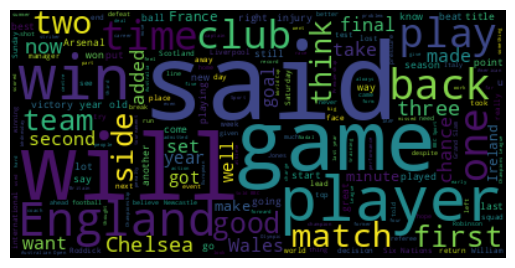



Class: 15


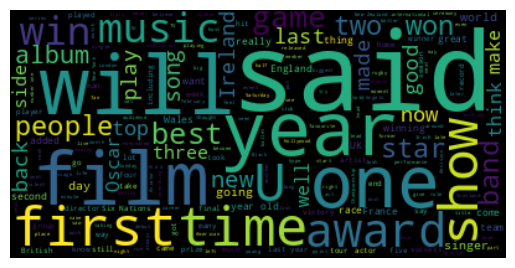



Class: 1


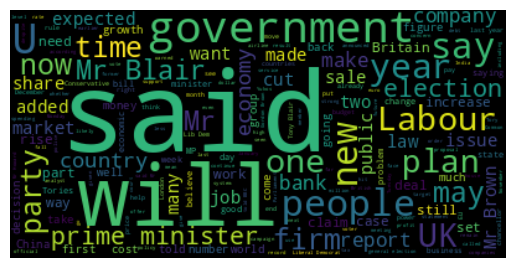



Class: 14


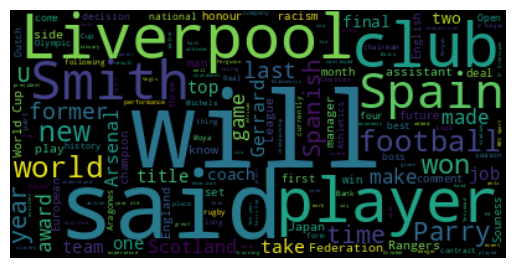



Class: 8


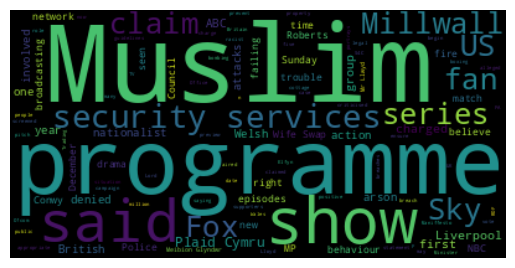



Class: 2


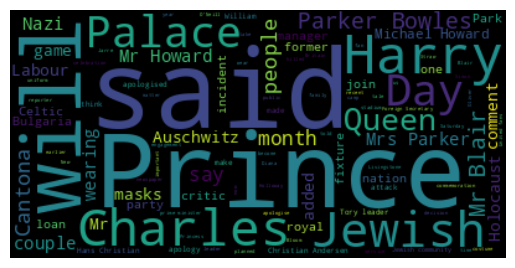



Class: 12


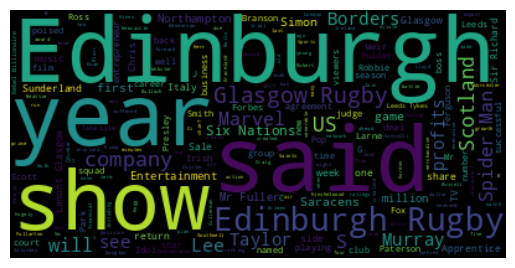



Class: 11


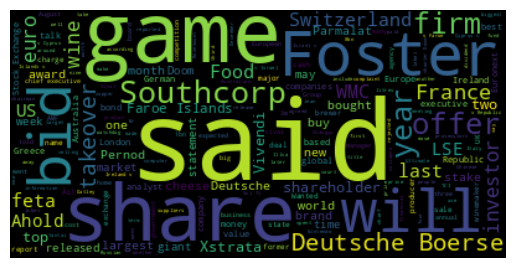



Class: 13


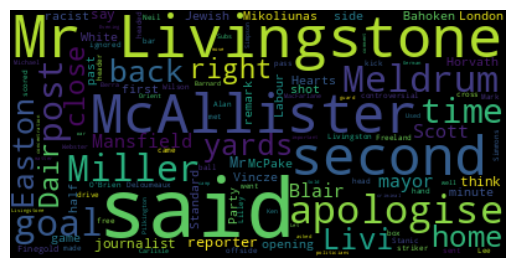



Class: 10


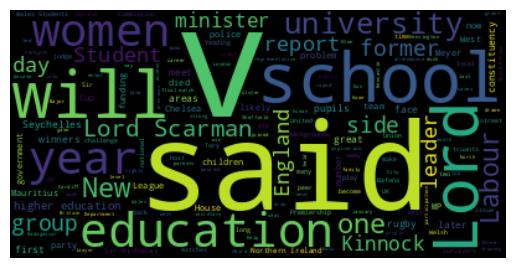



Class: 4


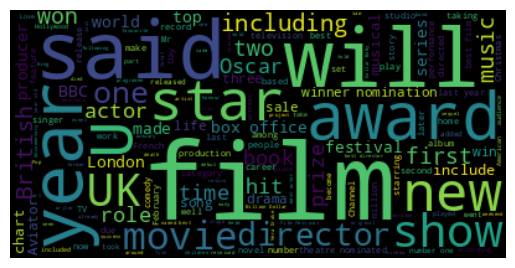



Class: 18


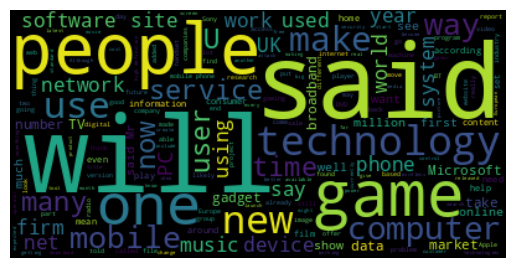



Class: 0


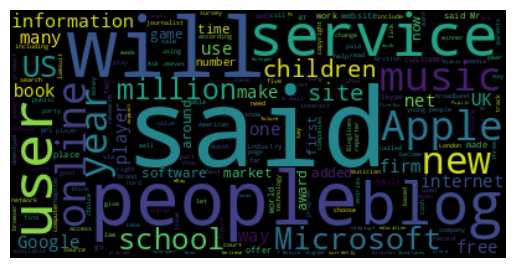



Class: 17


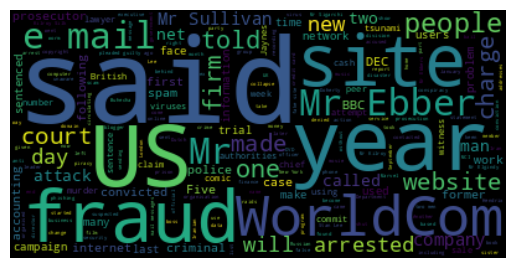



Class: 16


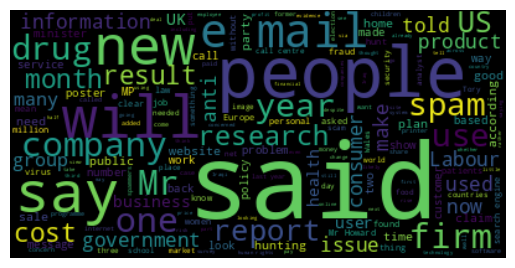



Class: 6


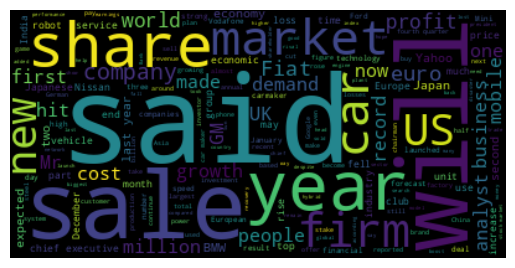



Class: 5


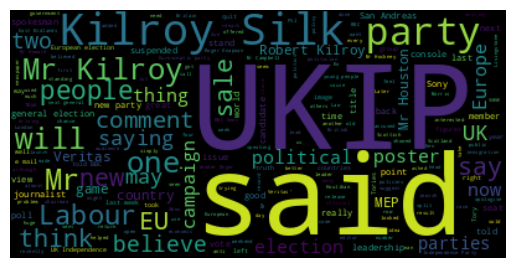



Class: 3


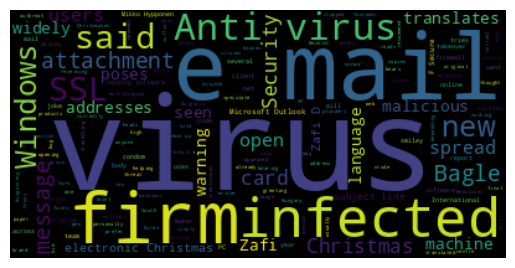



Class: 7


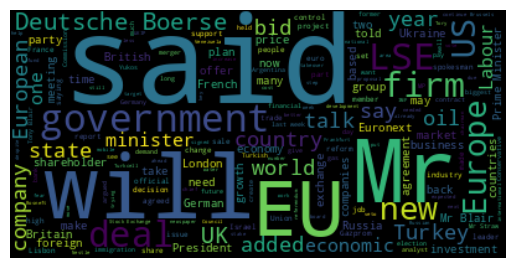



Class: 9


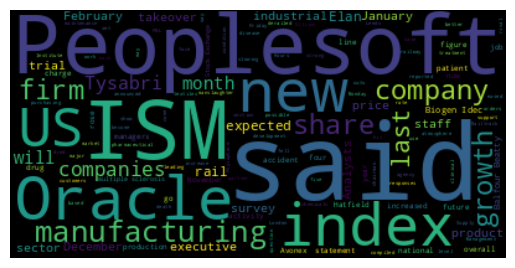

In [ ]:
with h5.File(file_name, 'r') as alg_file:
  best_labels = alg_file[cluster_key]
  print_wordcloud(bbc_texts, np.array(best_labels).argmax(axis=1))

Class: sport


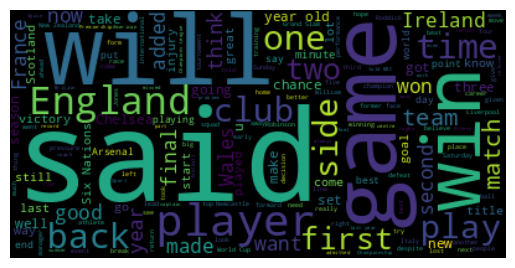



Class: entertainment


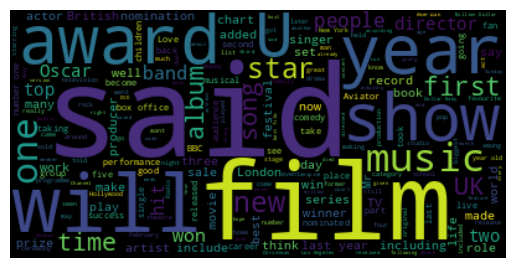



Class: tech


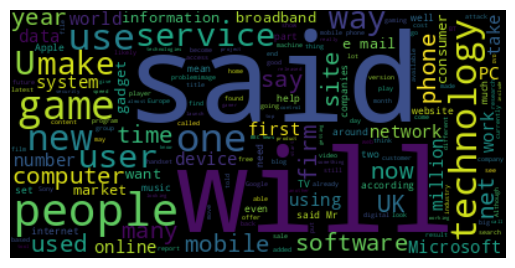



Class: business


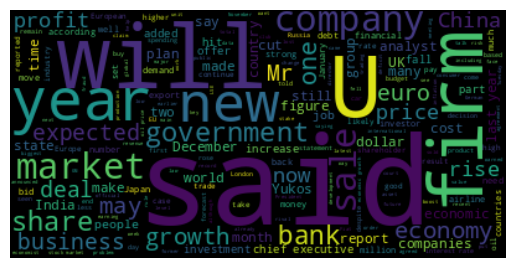



Class: politics


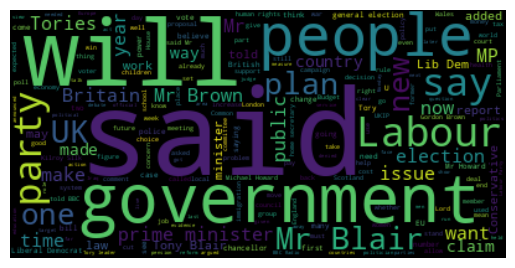

In [ ]:
print_wordcloud(bbc_texts, bbc_labels)

Après avoir comparé les nuages de mots, il est possible d'affirmer que les classes 13 et 14 correspondent approximativement à la classe "sports", car elles partagent des mots les plus fréquents similaires tant dans les classes réelles que dans les classes prédites. De même, la classe 15 correspond approximativement à la classe "entertainment" en raison des similarités des mots les plus fréquents entre ces deux classes. Par ailleurs, les classes 8 et 1 semblent correspondre approximativement à la classe "politics". Cependant, notre clustering n'a pas réussi à prédire les classes "business" et "tech", car aucune similarité de mots n'a été observée entre les différentes classes prédites et ces deux catégories.